In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
!pip install cufflinks

In [3]:
!pip install plotly

In [4]:
import matplotlib.pyplot as plt
import warnings

# plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

# Phân tích kỹ thuật với Python
Khởi tạo dạng đồ thị nến - Candlestick chart

Các thư viện sử dụng:

In [5]:
import pandas as pd 
import yfinance as yf

Tải dữ liệu giá điều chỉnh từ Yahoo Finance:

In [6]:
df_amzn = yf.download('AMZN', 
                       start='2010-01-01', 
                       end='2023-03-26',
                       progress=False,
                       auto_adjust=True)

Cách thức thực hiện...

Các thư viện sử dụng:

In [7]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

cf.go_offline()
init_notebook_mode()


Để thay thế cho việc chạy cf.go_offline() mọi lúc, chúng ta cũng có thể sửa đổi cài đặt để luôn sử dụng chế độ ngoại tuyến bằng cách chạy: cf.set_config_file(offline=True). Sau đó, chúng tôi có thể xem cài đặt bằng cách sử dụng cf.get_config_file().

Khởi tạo đồ thị dạng nến sử dụng giá cổ phiếu Amazon:

In [8]:
qf = cf.QuantFig(df_amzn, title="IBM Stock Price", 
                 legend='top', name='IBM')

Thêm khối lượng giao dịch và Đường trung bình:

In [9]:
qf.add_volume()
qf.add_sma(periods=200, column='Close', color='red')
#qf.add_ema(periods=20, color='green') 

Đồ thị hóa kết quả:

In [10]:
qf.iplot()

### Kiểm tra (Backtesting) với chiến lược giao dịch sử dụng Đường trung bình (Simple Moving Average)

Các thư viện sử dụng:

In [11]:
from datetime import datetime
import backtrader as bt

In [12]:
!pip install backtrader

Xây dựng tín hiệu giao dịch:

In [13]:
class SmaSignal(bt.Signal):
    params = (('period', 200), )
    
    def __init__(self):
        self.lines.signal = self.data - bt.ind.SMA(period=self.p.period)

Tải dữ liệu từ Yahoo Finance:

In [14]:
data = bt.feeds.PandasData(dataname=yf.download('AMZN', 
                      start='2010-01-01', 
                      end='2023-03-26',
                      progress=False,
                      auto_adjust=True))

Khởi tạo hệ thống kiểm tra - Backtest:

In [15]:
cerebro = bt.Cerebro(stdstats = False)
cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.add_signal(bt.SIGNAL_LONG, SmaSignal)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

Tiến hành chạy kiểm tra - Backtest:

In [16]:
print(f'Starting Portfolio Value: {cerebro.broker.getvalue():.2f}')
cerebro.run()
print(f'Final Portfolio Value: {cerebro.broker.getvalue():.2f}')

Starting Portfolio Value: 1000.00
Final Portfolio Value: 1052.08


Trực quan hóa kết quả:

In [17]:
import matplotlib.pyplot as plt

In [40]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 12]
plt.rcParams.update({'font.size': 12})
cerebro.plot(iplot=False, volume=False)

[[<Figure size 4500x3600 with 4 Axes>]]

In [19]:
#pip install matplotlib --user

In [20]:
#pip install matplotlib==3.2.2

Chiến lược giao dịch

Chiến lược giao dịch thử nghiệm:

In [21]:
class SmaStrategy(bt.Strategy):
    params = (('ma_period', 200), )

    def __init__(self):
        # keep track of close price in the series
        self.data_close = self.datas[0].close

        # keep track of pending orders/buy price/buy commission
        self.order = None
        self.price = None
        self.comm = None

        # add a simple moving average indicator
        self.sma = bt.ind.SMA(self.datas[0],
                              period=self.params.ma_period)
        
    def log(self, txt):
        dt = self.datas[0].datetime.date(0).isoformat()
        print(f'{dt}, {txt}')

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # order already submitted/accepted - no action required
            return

        # report executed order
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(f'BUY EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}')
                self.price = order.executed.price
                self.comm = order.executed.comm
            else:
                self.log(f'SELL EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}')

        # report failed order
        elif order.status in [order.Canceled, order.Margin, 
                              order.Rejected]:
            self.log('Order Failed')

        # set no pending order
        self.order = None

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log(f'OPERATION RESULT --- Gross: {trade.pnl:.2f}, Net: {trade.pnlcomm:.2f}')

    def next(self):
        # do nothing if an order is pending
        if self.order:
            return

        # check if there is already a position
        if not self.position:
            # buy condition
            if self.data_close[0] > self.sma[0]:
                self.log(f'BUY CREATED --- Price: {self.data_close[0]:.2f}')
                self.order = self.buy()
        else:
            # sell condition
            if self.data_close[0] < self.sma[0]:            
                self.log(f'SELL CREATED --- Price: {self.data_close[0]:.2f}')
                self.order = self.sell()

Cài đặt kiểm tra:

In [22]:
cerebro = bt.Cerebro(stdstats = False)

cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.addstrategy(SmaStrategy)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

Tiến hành kiểm tra - Backtest:

In [23]:
print(f'Starting Portfolio Value: {cerebro.broker.getvalue():.2f}')
cerebro.run()
print(f'Final Portfolio Value: {cerebro.broker.getvalue():.2f}')

Starting Portfolio Value: 1000.00
2010-10-18, BUY CREATED --- Price: 8.18
2010-10-19, BUY EXECUTED --- Price: 8.03, Cost: 8.03, Commission: 0.00
2011-08-18, SELL CREATED --- Price: 9.13
2011-08-19, SELL EXECUTED --- Price: 9.01, Cost: 8.03, Commission: 0.00
2011-08-19, OPERATION RESULT --- Gross: 0.98, Net: 0.98
2011-08-23, BUY CREATED --- Price: 9.68
2011-08-24, BUY EXECUTED --- Price: 9.69, Cost: 9.69, Commission: 0.00
2011-11-18, SELL CREATED --- Price: 9.86
2011-11-21, SELL EXECUTED --- Price: 9.66, Cost: 9.69, Commission: 0.00
2011-11-21, OPERATION RESULT --- Gross: -0.03, Net: -0.03
2012-03-26, BUY CREATED --- Price: 10.14
2012-03-27, BUY EXECUTED --- Price: 10.18, Cost: 10.18, Commission: 0.00
2012-04-02, SELL CREATED --- Price: 9.90
2012-04-03, SELL EXECUTED --- Price: 9.91, Cost: 10.18, Commission: 0.00
2012-04-03, OPERATION RESULT --- Gross: -0.27, Net: -0.27
2012-04-27, BUY CREATED --- Price: 11.34
2012-04-30, BUY EXECUTED --- Price: 11.20, Cost: 11.20, Commission: 0.00
2013

### Tính toán chỉ số Bollinger Bands và xây dựng/kiểm tra chiến lược giao dịch

Các thư viện sử dụng:

In [24]:
import backtrader as bt
import datetime
import pandas as pd
import matplotlib.pyplot as plt

Xây dựng tín hiệu giao dịch:

In [25]:
class BBand_Strategy(bt.Strategy):
    params = (('period', 20),
              ('devfactor', 2.0),)

    def __init__(self):
        # keep track of close price in the series
        self.data_close = self.datas[0].close
        self.data_open = self.datas[0].open

        # keep track of pending orders/buy price/buy commission
        self.order = None
        self.price = None
        self.comm = None

        # add Bollinger Bands indicator and track the buy/sell signals
        self.b_band = bt.ind.BollingerBands(self.datas[0], 
                                            period=self.p.period, 
                                            devfactor=self.p.devfactor)
        self.buy_signal = bt.ind.CrossOver(self.datas[0], 
                                           self.b_band.lines.bot)
        self.sell_signal = bt.ind.CrossOver(self.datas[0], 
                                            self.b_band.lines.top)

    def log(self, txt):
        '''Logging function'''
        dt = self.datas[0].datetime.date(0).isoformat()
        print(f'{dt}, {txt}')

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # order already submitted/accepted - no action required
            return

        # report executed order
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(
                    f'BUY EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}'
                )
                self.price = order.executed.price
                self.comm = order.executed.comm
            else:
                self.log(
                    f'SELL EXECUTED --- Price: {order.executed.price:.2f}, Cost: {order.executed.value:.2f}, Commission: {order.executed.comm:.2f}'
                )

        # report failed order
        elif order.status in [order.Canceled, order.Margin, 
                              order.Rejected]:
            self.log('Order Failed')

        # set no pending order
        self.order = None

    def notify_trade(self, trade):
        if not trade.isclosed:
            return

        self.log(f'OPERATION RESULT --- Gross: {trade.pnl:.2f}, Net: {trade.pnlcomm:.2f}')

    def next_open(self):
        if not self.position:
            if self.buy_signal > 0:
                # calculate the max number of shares ('all-in')
                size = int(self.broker.getcash() / self.datas[0].open)
                # buy order
                self.log(f'BUY CREATED --- Size: {size}, Cash: {self.broker.getcash():.2f}, Open: {self.data_open[0]}, Close: {self.data_close[0]}')
                self.buy(size=size)
        else:
            if self.sell_signal < 0:
                # sell order
                self.log(f'SELL CREATED --- Size: {self.position.size}')
                self.sell(size=self.position.size)

Tải dữ liệu:

In [26]:
data = bt.feeds.PandasData(dataname=yf.download('AMZN', 
                      start='2020-01-01', 
                      end='2023-03-26',
                      progress=False,
                      auto_adjust=True))

Cài đặt chiến lược kiểm tra:

In [27]:
cerebro = bt.Cerebro(stdstats = False, cheat_on_open=True)

cerebro.addstrategy(BBand_Strategy)
cerebro.adddata(data)
cerebro.broker.setcash(10000.0)
cerebro.broker.setcommission(commission=0.001)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)
cerebro.addanalyzer(bt.analyzers.Returns, _name='returns')
cerebro.addanalyzer(bt.analyzers.TimeReturn, _name='time_return')

Chạy kiểm tra - Backtest:

In [28]:
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
backtest_result = cerebro.run()
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 10000.00
2020-03-03, BUY CREATED --- Size: 101, Cash: 10000.00, Open: 98.76850128173828, Close: 95.44950103759766
2020-03-03, BUY EXECUTED --- Price: 98.77, Cost: 9975.62, Commission: 9.98
2020-04-20, SELL CREATED --- Size: 101
2020-04-20, SELL EXECUTED --- Price: 119.50, Cost: 9975.62, Commission: 12.07
2020-04-20, OPERATION RESULT --- Gross: 2093.63, Net: 2071.58
2020-11-03, BUY CREATED --- Size: 79, Cash: 12071.58, Open: 150.92649841308594, Close: 152.42050170898438
2020-11-03, BUY EXECUTED --- Price: 150.93, Cost: 11923.19, Commission: 11.92
2020-12-18, SELL CREATED --- Size: 79
2020-12-18, SELL EXECUTED --- Price: 162.20, Cost: 11923.19, Commission: 12.81
2020-12-18, OPERATION RESULT --- Gross: 890.57, Net: 865.83
2021-02-24, BUY CREATED --- Size: 81, Cash: 12937.41, Open: 158.33749389648438, Close: 157.97650146484375
2021-02-24, BUY EXECUTED --- Price: 158.34, Cost: 12825.34, Commission: 12.83
2021-04-14, SELL CREATED --- Size: 81
2021-04-14, SELL EXECUT

Trực quan hóa kết quả:

In [29]:
%matplotlib inline

plt.rcParams['figure.figsize'] = [15, 12]

plt.rcParams.update({'font.size': 12})

cerebro.plot(iplot=False, volume=False)


[[<Figure size 4500x3600 with 4 Axes>]]

Tiến hành khám phá các số liệu lợi nhuận khác nhau:

In [30]:
print(backtest_result[0].analyzers.returns.get_analysis())

OrderedDict([('rtot', 0.0332934808379896), ('ravg', 4.095139094463666e-05), ('rnorm', 0.010373182787815316), ('rnorm100', 1.0373182787815316)])


Tạo biểu đồ lợi nhuận danh mục đầu tư hàng ngày:

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

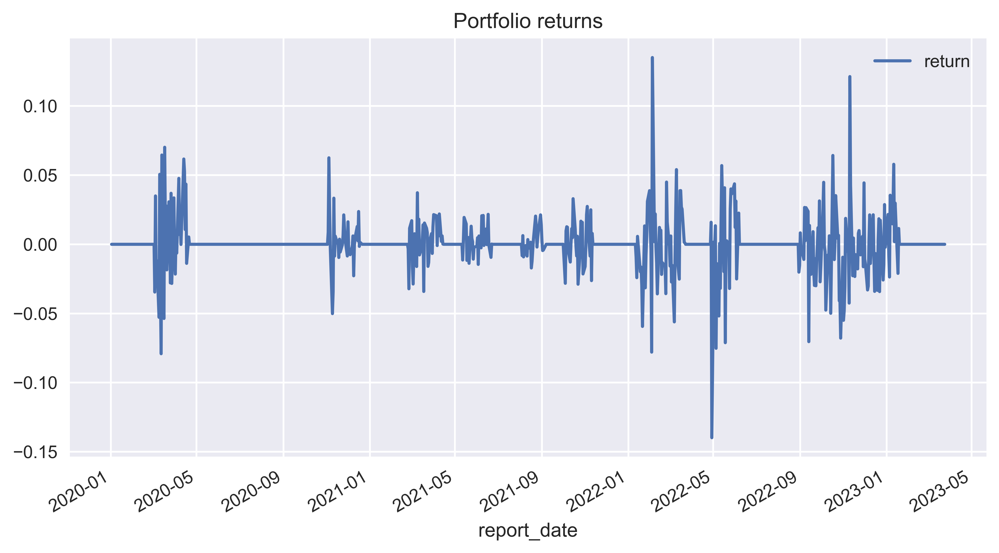

In [32]:
returns_dict = backtest_result[0].analyzers.time_return.get_analysis()
returns_df = pd.DataFrame(list(returns_dict.items()), 
                          columns = ['report_date', 'return']) \
               .set_index('report_date')
returns_df.plot(title='Portfolio returns')

plt.tight_layout()
# plt.savefig('images/ch2_im9.png')
plt.show()

### Tính toán chỉ số RSI - Relative Strength Index và chiến lược giao dịch

Các thư viện sử dụng:

In [33]:
from datetime import datetime
import backtrader as bt

In [34]:
import talib

Xây dựng tín hiệu giao dịch:

In [35]:
# create a Stratey
class RsiSignalStrategy(bt.SignalStrategy):
    params = dict(rsi_periods=14, rsi_upper=75, 
                  rsi_lower=25, rsi_mid=50)

    def __init__(self):
        
        # add RSI indicator
        rsi = bt.indicators.RSI(period=self.p.rsi_periods,
                                upperband=self.p.rsi_upper,
                                lowerband=self.p.rsi_lower)

        # add RSI from TA-lib just for reference 
        bt.talib.RSI(self.data, plotname='TA_RSI')
        
        # long condition (with exit)
        rsi_signal_long = bt.ind.CrossUp(rsi, self.p.rsi_lower, plot=False)
        self.signal_add(bt.SIGNAL_LONG, rsi_signal_long)
        self.signal_add(bt.SIGNAL_LONGEXIT, -(rsi > self.p.rsi_mid))

        # short condition (with exit)
        rsi_signal_short = -bt.ind.CrossDown(rsi, self.p.rsi_upper, plot=False)
        self.signal_add(bt.SIGNAL_SHORT, rsi_signal_short)
        self.signal_add(bt.SIGNAL_SHORTEXIT, rsi < self.p.rsi_mid)

Tải dữ liệu:

In [36]:
data = bt.feeds.PandasData(dataname=yf.download('AMZN', 
                      start='2020-01-01', 
                      end='2023-03-26',
                      progress=False,
                      auto_adjust=True))

In [37]:
cerebro.adddata(data)

Cài đặt và chạy kiểm tra:

In [38]:
cerebro = bt.Cerebro(stdstats = False)

cerebro.addstrategy(RsiSignalStrategy)
cerebro.adddata(data)
cerebro.broker.setcash(1000.0)
cerebro.broker.setcommission(commission=0.001)
cerebro.addobserver(bt.observers.BuySell)
cerebro.addobserver(bt.observers.Value)

cerebro.run()

Trực quan hóa kết quả:

In [39]:
%matplotlib inline

plt.rcParams['figure.figsize'] = [15, 12]

plt.rcParams.update({'font.size': 12})

cerebro.plot(iplot=False, volume=False)

[[<Figure size 4500x3600 with 4 Axes>]]